<p style="text-align: center;"><img class="responsive" style="float: left;" src="https://i0.wp.com/mosefparis1.fr/wp-content/uploads/2022/10/cropped-image-1.png?fit=532%2C540&amp;ssl=1" alt="" width="199" height="202" /><span style="font-family: verdana, geneva, sans-serif; font-size: 36pt;">Data Mining</span></p>
<p style="text-align: center;">by Lucie Gabagnou &amp; Yanis Rehoune</p>

#### Installing packages

In [1]:
import pandas as pd
import numpy as np
import random
import statsmodels.api as sm


from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression,Ridge,RANSACRegressor,HuberRegressor
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
import xgboost as xgb


import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go

#### Importing data

Make sure to put data files in "data" folder

In [4]:
# DATASETS FOR EXPLORATORY ANALYSIS,PCA, CLUSTERING
base_tourisme_2022=pd.read_csv("data/base-cc-tourisme-2022-geo2022.csv",sep=";")
base_pop_1876_2019=pd.read_excel("data/base-pop-historiques-1876-2019.xlsx",header=5)
communes_2022=pd.read_csv("data/commune_2022.csv") 

#DATASETS FOR MODELING 
base_electricite=pd.read_csv("data/conso-elec-gaz-annuelle-par-secteur-dactivite-agregee-commune-france.csv")
agri_externe=pd.read_csv("data/FDS_G_2002_2010.txt",sep=";")

/var/folders/wc/46qsbhjx40lf12wjbnjcyx680000gn/T/ipykernel_1363/1703619886.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  base_tourisme_2022=pd.read_csv("data/base-cc-tourisme-2022-geo2022.csv",sep=";")
/var/folders/wc/46qsbhjx40lf12wjbnjcyx680000gn/T/ipykernel_1363/1703619886.py:7: DtypeWarning: Columns (25,29) have mixed types. Specify dtype option on import or set low_memory=False.
  base_electricite=pd.read_csv("data/conso-elec-gaz-annuelle-par-secteur-dactivite-agregee-commune-france.csv")
/var/folders/wc/46qsbhjx40lf12wjbnjcyx680000gn/T/ipykernel_1363/1703619886.py:8: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  agri_externe=pd.read_csv("data/FDS_G_2002_2010.txt",sep=";")


#### Fonctions

In [5]:

from scripts.functions import missing_rate_report, pca_graph,pca_graph_clusters,kmeans_graph,get_correlation_circle_2_components,create_mod_for_secretisees,features_corr_for_2_components,grid_search_ridge,erase_correlated_var,OLS_reports,processing_ml


## Exploratory Data Analysis
- Read the datasets base-cc-tourisme-2022-geo2022.csv and base-pop-historiques-1876-2019.xlsx
- Merge the two datasets
- Analyze missing values and outliers
- Use an appropriate method to impute missing values (explain and justify the choice of your method)
- Analyze the correlation of the variables

#### Overview

##### Population


In [6]:
base_pop_1876_2019.head(10).style.set_caption("Base_pop_1876_2019")


,CODGEO,REG,DEP,LIBGEO,PMUN19,PMUN18,PMUN17,PMUN16,PMUN15,PMUN14,PMUN13,PMUN12,PMUN11,PMUN10,PMUN09,PMUN08,PMUN07,PMUN06,PSDC99,PSDC90,PSDC82,PSDC75,PSDC68,PSDC62,PTOT54,PTOT36,PTOT1931,PTOT1926,PTOT1921,PTOT1911,PTOT1906,PTOT1901,PTOT1896,PTOT1891,PTOT1886,PTOT1881,PTOT1876
0,01001,84,01,L'Abergement-Clémenciat,779,771,776,767,767,767,767,777,780,784,787,791,804,811,728,579,477,368,347,407,424.000000,506.000000,540.000000,543.000000,566.000000,560.000000,629.000000,637.000000,572.000000,594.000000,622.000000,605.000000,604.000000
1,01002,84,01,L'Abergement-de-Varey,256,253,248,243,241,239,236,235,234,221,207,194,195,198,168,159,136,106,88,103,157.000000,203.000000,219.000000,253.000000,256.000000,291.000000,323.000000,357.000000,391.000000,421.000000,486.000000,490.000000,484.000000
2,01004,84,01,Ambérieu-en-Bugey,14134,14204,14035,14081,14127,14022,14359,14233,13839,13835,13350,12792,12696,12709,11436,10455,9737,9550,8949,7748,7159.000000,6846.000000,6794.000000,5705.000000,4796.000000,4334.000000,4100.000000,4023.000000,3548.000000,3635.000000,3618.000000,3396.000000,3427.000000
3,01005,84,01,Ambérieux-en-Dombes,1751,1720,1689,1671,1619,1627,1635,1642,1600,1616,1592,1567,1544,1436,1408,1156,848,756,627,588,570.000000,593.000000,618.000000,690.000000,698.000000,805.000000,805.000000,835.000000,852.000000,862.000000,882.000000,879.000000,848.000000
4,01006,84,01,Ambléon,112,112,111,110,109,109,108,110,112,116,120,123,125,120,86,76,65,82,108,107,111.000000,141.000000,135.000000,161.000000,150.000000,159.000000,193.000000,200.000000,206.000000,200.000000,200.000000,213.000000,191.000000
5,01007,84,01,Ambronay,2800,2763,2726,2684,2615,2570,2503,2437,2365,2362,2328,2296,2263,2241,2146,1996,1862,1270,1193,1037,1216.000000,1097.000000,1164.000000,1208.000000,1171.000000,1241.000000,1282.000000,1278.000000,1327.000000,1415.000000,1501.000000,1492.000000,1506.000000
6,01008,84,01,Ambutrix,762,755,752,750,747,743,744,739,734,729,660,657,649,641,586,595,405,353,327,293,263.000000,249.000000,277.000000,284.000000,260.000000,241.000000,236.000000,263.000000,264.000000,270.000000,280.000000,280.000000,294.000000
7,01009,84,01,Andert-et-Condon,326,324,330,336,342,338,337,338,339,340,336,331,325,319,275,262,276,184,159,166,170.000000,209.000000,215.000000,230.000000,261.000000,301.000000,311.000000,335.000000,331.000000,333.000000,376.000000,278.000000,282.000000
8,01010,84,01,Anglefort,1105,1113,1115,1124,1133,1142,1108,1069,1031,994,960,926,918,900,769,687,714,697,528,438,507.000000,565.000000,630.000000,676.000000,752.000000,895.000000,964.000000,995.000000,1000.000000,1000.000000,1075.000000,1135.000000,1118.000000
9,01011,84,01,Apremont,368,373,376,383,390,397,394,385,374,363,352,339,333,333,329,341,279,200,148,176,187.000000,218.000000,207.000000,201.000000,236.000000,287.000000,306.000000,338.000000,314.000000,298.000000,294.000000,308.000000,334.000000


It seems that the values in the first dataset are continuous, and have very far-off values. This is confirmed by the following report:



In [7]:
base_pop_1876_2019.describe()

,REG,PMUN19,PMUN18,PMUN17,PMUN16,PMUN15,PMUN14,PMUN13,PMUN12,PMUN11,...,PTOT1926,PTOT1921,PTOT1911,PTOT1906,PTOT1901,PTOT1896,PTOT1891,PTOT1886,PTOT1881,PTOT1876
count,34967.000000,34967.000000,34967.000000,34967.000000,34967.00000,34967.000000,34967.000000,34967.000000,34967.000000,34967.000000,...,34495.000000,34495.000000,34495.000000,34495.000000,34495.000000,34495.000000,34495.000000,34495.000000,34495.000000,34495.000000
mean,52.277347,1915.760660,1908.443332,1902.489176,1897.83676,1892.935625,1884.838848,1875.046644,1865.794635,1856.990877,...,1172.888042,1128.656008,1192.855167,1182.215017,1170.897608,1155.849485,1149.733788,1145.339643,1129.720945,1106.640412
std,24.330841,10113.987851,10059.679379,10007.369827,9983.89098,9965.062129,9919.693649,9862.891770,9825.088810,9786.413390,...,7618.186779,7302.623936,7071.189479,6673.656365,6470.802101,6131.071142,5813.652571,5480.196742,5218.362316,4728.735668
min,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,198.000000,198.000000,199.000000,199.00000,199.000000,199.000000,199.000000,198.000000,198.000000,...,229.000000,230.000000,265.000000,277.000000,283.000000,293.000000,304.000000,315.000000,321.000000,329.000000
50%,44.000000,457.000000,457.000000,457.000000,456.00000,456.000000,455.000000,454.000000,451.000000,449.000000,...,424.000000,426.000000,488.000000,505.000000,509.000000,520.000000,533.000000,548.000000,556.000000,566.000000
75%,76.000000,1160.000000,1157.000000,1157.500000,1156.00000,1152.000000,1146.000000,1140.000000,1134.000000,1127.000000,...,830.000000,831.000000,929.000000,954.000000,961.000000,980.000000,1004.000000,1017.000000,1019.000000,1027.000000
max,94.000000,870731.000000,868277.000000,863310.000000,862211.00000,861635.000000,858120.000000,855393.000000,852516.000000,850636.000000,...,652196.000000,586341.000000,550619.000000,517498.000000,491161.000000,468311.000000,440315.000000,404172.000000,378581.000000,344513.000000


The variables in this dataset appear to be all continuous (except for geographical variables of course). Extreme values are rather similar. The same is true for standard deviations, means, and quantiles. In this sense, it will be interesting to treat these features in the same way.

##### Tourism

In [8]:
base_tourisme_2022.head(10).style.set_caption("Base_tourisme_2022")

,CODGEO,HT22,HT022,HT122,HT222,HT322,HT422,HT522,HTCH22,HTCH022,HTCH122,HTCH222,HTCH322,HTCH422,HTCH522,CPG22,CPG022,CPG122,CPG222,CPG322,CPG422,CPG522,CPGE22,CPGE022,CPGE122,CPGE222,CPGE322,CPGE422,CPGE522,CPGEL22,CPGEL022,CPGEL122,CPGEL222,CPGEL322,CPGEL422,CPGEL522,CPGEO22,CPGEO022,CPGEO122,CPGEO222,CPGEO322,CPGEO422,CPGEO522,VV22,VVUH22,VVLIT22,RT22,RTUH22,RTLIT22,AJCS22,AJCSUH22,AJCSLIT22
0,01001,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,01002,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,01004,1,0,0,0,1,0,0,34,0,0,0,34,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,16,16,0,0,0
3,01005,2,1,0,0,1,0,0,20,7,0,0,13,0,0,1,0,0,1,0,0,0,72,0,0,72,0,0,0,4,0,0,4,0,0,0,68,0,0,68,0,0,0,0,0,0,0,0,0,0,0,0
4,01006,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,01007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,01008,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,01009,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,01010,1,1,0,0,0,0,0,15,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,01011,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [9]:
base_tourisme_2022.describe()

,HT22,HT022,HT122,HT222,HT322,HT422,HT522,HTCH22,HTCH022,HTCH122,...,CPGEO522,VV22,VVUH22,VVLIT22,RT22,RTUH22,RTLIT22,AJCS22,AJCSUH22,AJCSLIT22
count,34983.000000,34983.000000,34983.000000,34983.000000,34983.00000,34983.00000,34983.000000,34983.000000,34983.000000,34983.000000,...,34983.000000,34983.000000,34983.000000,34983.000000,34983.000000,34983.000000,34983.000000,34983.000000,34983.000000,34983.000000
mean,0.538833,0.127548,0.010748,0.112998,0.19641,0.07618,0.014950,21.483892,2.861018,0.374382,...,2.247091,0.026327,1.957351,7.285739,0.071263,5.052740,19.211817,0.010662,0.443330,1.452162
std,9.133559,1.080078,0.176029,1.087824,3.93927,2.59694,0.584107,488.686122,41.706074,6.190064,...,45.003055,0.233956,24.202562,88.131613,0.818699,64.195484,234.750537,0.147107,10.212587,33.303292
min,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1585.000000,165.000000,23.000000,160.000000,688.00000,456.00000,93.000000,84023.000000,6914.000000,588.000000,...,3880.000000,8.000000,1340.000000,3948.000000,66.000000,5940.000000,16410.000000,16.000000,1508.000000,4930.000000


The distribution of these variables is unusual. The entire distribution seems to be concentrated around 0 as seen with the quantiles. 75% of the distribution of each variable takes the value of 0. It is necessary to question whether these are extreme values or aberrant values. Indeed, it is possible that the value taken is a notation error but it may also be voluntary. It may also be that all extreme values are observed for a single observation.

In [10]:
base_tourisme_2022[base_tourisme_2022["HT22"]==1585] #Paris


,CODGEO,HT22,HT022,HT122,HT222,HT322,HT422,HT522,HTCH22,HTCH022,...,CPGEO522,VV22,VVUH22,VVLIT22,RT22,RTUH22,RTLIT22,AJCS22,AJCSUH22,AJCSLIT22
29260,75056,1585,165,23,160,688,456,93,84023,6914,...,0,0,0,0,66,5940,14610,16,1508,4930


It is typically observed that the observation with one of the extreme values also has others. This is Paris, so it is rather logical. It includes all the extreme values for 2/3 star hotels. The same is true for campings, which must all be concentrated.

In [11]:
base_tourisme_2022[base_tourisme_2022["CPGE22"]==14343] # Argeles sur Mer has a lot of campings

,CODGEO,HT22,HT022,HT122,HT222,HT322,HT422,HT522,HTCH22,HTCH022,...,CPGEO522,VV22,VVUH22,VVLIT22,RT22,RTUH22,RTLIT22,AJCS22,AJCSUH22,AJCSLIT22
25884,66008,21,3,2,7,6,3,0,562,48,...,3880,3,443,2196,4,532,2384,1,22,125


#### Joining bases

It is noticed that the column for merging the tables will be CODGEO, we quickly verify that it does not contain any NaN values.



In [12]:
print("% of NaN for the column used for merge (base tourisme 2022 vs base pop): ",base_tourisme_2022["CODGEO"].isna().sum()/len(base_tourisme_2022)*100, "vs", base_pop_1876_2019["CODGEO"].isna().sum()/len(base_pop_1876_2019)*100 )

% of NaN for the column used for merge (base tourisme 2022 vs base pop):  0.0 vs 0.0


Here, a "left" merge was performed, but it is not the best option for PCA. However, it allows us to easily perform the joins for external databases in the ML part.


In [13]:
base_with_all_features=pd.merge(left=base_tourisme_2022, right=base_pop_1876_2019, on="CODGEO", how='left')

In [14]:
base_with_all_features

,CODGEO,HT22,HT022,HT122,HT222,HT322,HT422,HT522,HTCH22,HTCH022,...,PTOT1926,PTOT1921,PTOT1911,PTOT1906,PTOT1901,PTOT1896,PTOT1891,PTOT1886,PTOT1881,PTOT1876
0,01001,0,0,0,0,0,0,0,0,0,...,543.0,566.0,560.0,629.0,637.0,572.0,594.0,622.0,605.0,604.0
1,01002,0,0,0,0,0,0,0,0,0,...,253.0,256.0,291.0,323.0,357.0,391.0,421.0,486.0,490.0,484.0
2,01004,1,0,0,0,1,0,0,34,0,...,5705.0,4796.0,4334.0,4100.0,4023.0,3548.0,3635.0,3618.0,3396.0,3427.0
3,01005,2,1,0,0,1,0,0,20,7,...,690.0,698.0,805.0,805.0,835.0,852.0,862.0,882.0,879.0,848.0
4,01006,0,0,0,0,0,0,0,0,0,...,161.0,150.0,159.0,193.0,200.0,206.0,200.0,200.0,213.0,191.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34978,75116,70,3,0,3,29,27,8,3141,98,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34979,75117,121,14,2,6,62,35,2,7668,520,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34980,75118,60,15,3,6,23,13,0,3850,820,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34981,75119,24,4,0,7,11,2,0,2204,117,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Missing values treatment

In [15]:
missing_rate_df=missing_rate_report(base_with_all_features)
missing_rate_df[missing_rate_df["rate"]>50]

,count,rate
PTOT1876,18959,54.194895
PTOT1901,18959,54.194895
PTOT1931,18959,54.194895
PTOT1926,18959,54.194895
PTOT1921,18959,54.194895
PTOT1906,18959,54.194895
PTOT1911,18959,54.194895
PTOT1896,18959,54.194895
PTOT1891,18959,54.194895
PTOT1886,18959,54.194895


Missing values must be handled. For this, based on the previous analysis, we will handle missing values as follows:
- Features from the first dataset will be handled by using the median
- Features from the second dataset will be handled by imputing with 0. It is noted that this second dataset is filled with 0 in 3/4 of the cases, so it is wise to impute in this way.

In [16]:
print("Tourism features",base_tourisme_2022.columns)
print("Population features",base_pop_1876_2019.columns)

Tourism features Index(['CODGEO', 'HT22', 'HT022', 'HT122', 'HT222', 'HT322', 'HT422', 'HT522',
       'HTCH22', 'HTCH022', 'HTCH122', 'HTCH222', 'HTCH322', 'HTCH422',
       'HTCH522', 'CPG22', 'CPG022', 'CPG122', 'CPG222', 'CPG322', 'CPG422',
       'CPG522', 'CPGE22', 'CPGE022', 'CPGE122', 'CPGE222', 'CPGE322',
       'CPGE422', 'CPGE522', 'CPGEL22', 'CPGEL022', 'CPGEL122', 'CPGEL222',
       'CPGEL322', 'CPGEL422', 'CPGEL522', 'CPGEO22', 'CPGEO022', 'CPGEO122',
       'CPGEO222', 'CPGEO322', 'CPGEO422', 'CPGEO522', 'VV22', 'VVUH22',
       'VVLIT22', 'RT22', 'RTUH22', 'RTLIT22', 'AJCS22', 'AJCSUH22',
       'AJCSLIT22'],
      dtype='object')
Population features Index(['CODGEO', 'REG', 'DEP', 'LIBGEO', 'PMUN19', 'PMUN18', 'PMUN17',
       'PMUN16', 'PMUN15', 'PMUN14', 'PMUN13', 'PMUN12', 'PMUN11', 'PMUN10',
       'PMUN09', 'PMUN08', 'PMUN07', 'PMUN06', 'PSDC99', 'PSDC90', 'PSDC82',
       'PSDC75', 'PSDC68', 'PSDC62', 'PTOT54', 'PTOT36', 'PTOT1931',
       'PTOT1926', 'PTOT1921', 

In [17]:
base_with_all_features[base_tourisme_2022.columns]=base_with_all_features[base_tourisme_2022.columns].fillna(0)
base_with_all_features[base_pop_1876_2019.columns]=base_with_all_features[base_pop_1876_2019.columns].fillna(base_with_all_features[base_pop_1876_2019.columns].median())

/var/folders/wc/46qsbhjx40lf12wjbnjcyx680000gn/T/ipykernel_1363/895883585.py:2: FutureWarning: The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  base_with_all_features[base_pop_1876_2019.columns]=base_with_all_features[base_pop_1876_2019.columns].fillna(base_with_all_features[base_pop_1876_2019.columns].median())


In [18]:
missing_rate_report(base_with_all_features)


,count,rate
DEP,18599,53.165823
LIBGEO,18599,53.165823
CODGEO,0,0.000000
PMUN18,0,0.000000
PMUN10,0,0.000000
...,...,...
CPGE422,0,0.000000
CPGE322,0,0.000000
CPGE222,0,0.000000
CPGE122,0,0.000000


We are left with the LIBGEO and DEP variables which we will impute using an additional resource. The CODGEO, being codes established by INSEE, it is easy to find, for the given CODGEO, the name of the municipality. (using commune_2022.csv)

In [19]:
dict_communes_codgeo=dict(zip(communes_2022.COM.astype(str), communes_2022.NCCENR))
dict_departements_codgeo=dict(zip(communes_2022.COM.astype(str),communes_2022.DEP.astype(str)))
communes_2022.head(5)


,TYPECOM,COM,REG,DEP,CTCD,ARR,TNCC,NCC,NCCENR,LIBELLE,CAN,COMPARENT
0,COM,01001,84.0,01,01D,012,5,ABERGEMENT CLEMENCIAT,Abergement-Clémenciat,L'Abergement-Clémenciat,0108,NaN
1,COM,01002,84.0,01,01D,011,5,ABERGEMENT DE VAREY,Abergement-de-Varey,L'Abergement-de-Varey,0101,NaN
2,COM,01004,84.0,01,01D,011,1,AMBERIEU EN BUGEY,Ambérieu-en-Bugey,Ambérieu-en-Bugey,0101,NaN
3,COM,01005,84.0,01,01D,012,1,AMBERIEUX EN DOMBES,Ambérieux-en-Dombes,Ambérieux-en-Dombes,0122,NaN
4,COM,01006,84.0,01,01D,011,1,AMBLEON,Ambléon,Ambléon,0104,NaN


In [20]:
# Fill na for LIBGEO DEP
base_with_all_features['LIBGEO'] = base_with_all_features['LIBGEO'].fillna(base_with_all_features['CODGEO'].astype(str).apply(lambda x: dict_communes_codgeo.get(x)))
base_with_all_features['DEP'] = base_with_all_features['DEP'].fillna(base_with_all_features['CODGEO'].astype(str).apply(lambda x: dict_departements_codgeo.get(x)))
base_with_all_features.head(5)

,CODGEO,HT22,HT022,HT122,HT222,HT322,HT422,HT522,HTCH22,HTCH022,...,PTOT1926,PTOT1921,PTOT1911,PTOT1906,PTOT1901,PTOT1896,PTOT1891,PTOT1886,PTOT1881,PTOT1876
0,01001,0,0,0,0,0,0,0,0,0,...,543.0,566.0,560.0,629.0,637.0,572.0,594.0,622.0,605.0,604.0
1,01002,0,0,0,0,0,0,0,0,0,...,253.0,256.0,291.0,323.0,357.0,391.0,421.0,486.0,490.0,484.0
2,01004,1,0,0,0,1,0,0,34,0,...,5705.0,4796.0,4334.0,4100.0,4023.0,3548.0,3635.0,3618.0,3396.0,3427.0
3,01005,2,1,0,0,1,0,0,20,7,...,690.0,698.0,805.0,805.0,835.0,852.0,862.0,882.0,879.0,848.0
4,01006,0,0,0,0,0,0,0,0,0,...,161.0,150.0,159.0,193.0,200.0,206.0,200.0,200.0,213.0,191.0


In [21]:
geo_variables=base_with_all_features[["LIBGEO","DEP","CODGEO"]] #Keep apart theses variables
geo_variables.head(5)

,LIBGEO,DEP,CODGEO
0,L'Abergement-Clémenciat,01,01001
1,L'Abergement-de-Varey,01,01002
2,Ambérieu-en-Bugey,01,01004
3,Ambérieux-en-Dombes,01,01005
4,Ambléon,01,01006


#### Correlation analysis
We isolate the features from both bases in order to perform a visible correlation analysis (too many important features)

In [22]:

features_tourism=base_tourisme_2022.drop(columns="CODGEO").columns
features_pop=base_pop_1876_2019.drop(columns=["LIBGEO","DEP","CODGEO"]).columns

In [23]:
base_with_all_features.drop(columns=geo_variables.columns,inplace=True)

##### Tourism

Text(0.5, 1.0, 'Correlation matrix for tourism')

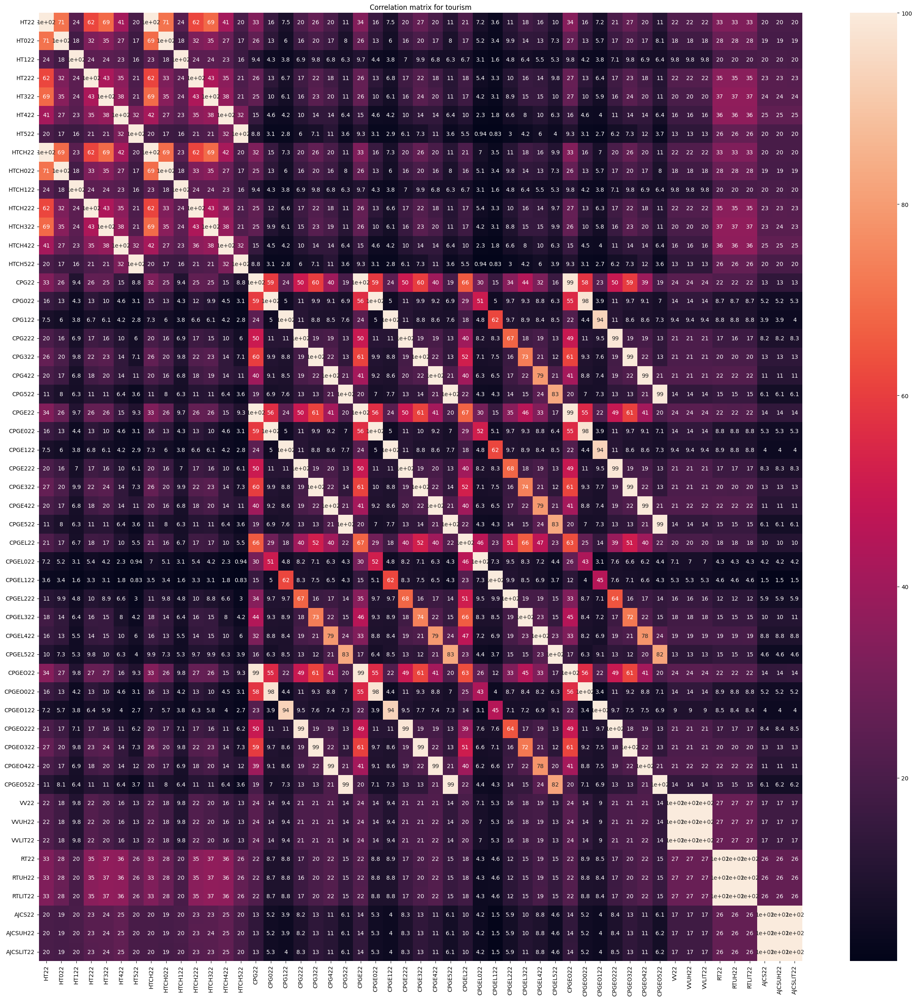

In [24]:

plt.figure(figsize = (30,30))
sns.heatmap(base_with_all_features[features_tourism].corr(method = 'spearman')*100 , annot = True)
plt.title("Correlation matrix for tourism")

The variables are strongly correlated within the same group of variables. Typically, CPGE (camping) variables are correlated.

##### Population

Text(0.5, 1.0, 'Correlation matrix for population')

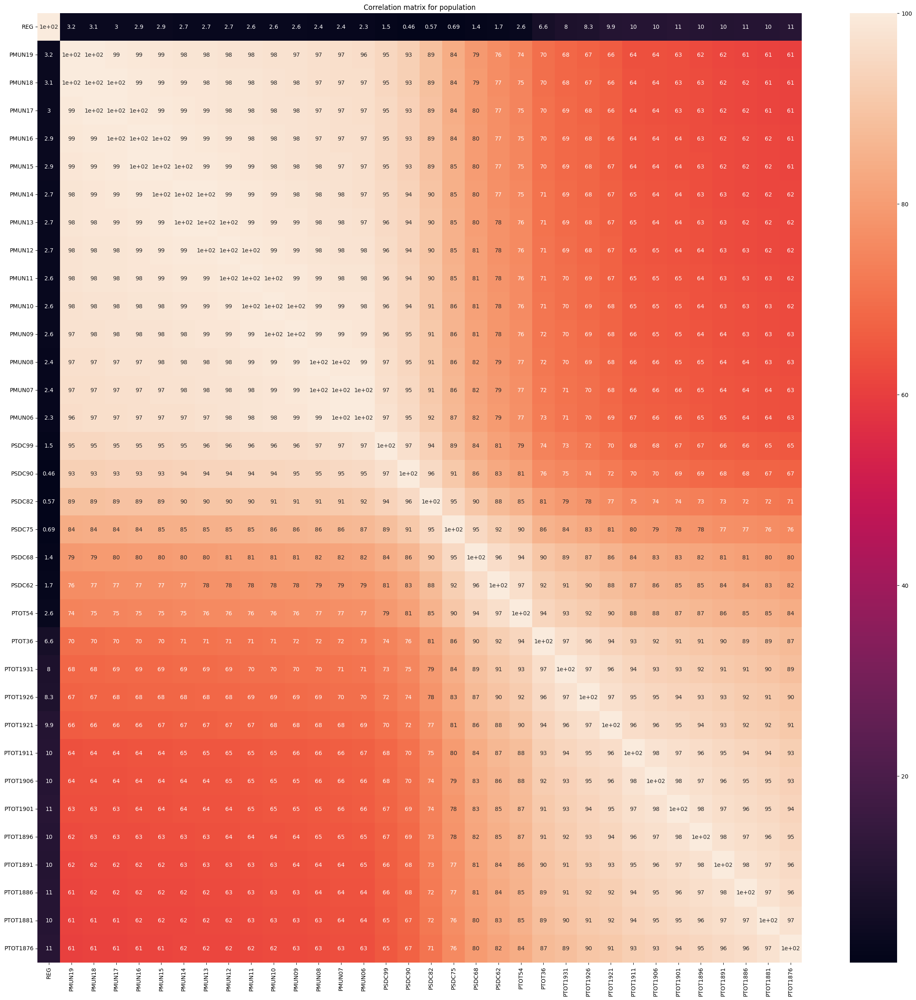

In [25]:
plt.figure(figsize = (30,30))
sns.heatmap(base_with_all_features[features_pop].corr(method = 'spearman')*100 , annot = True) 
plt.title("Correlation matrix for population")

Everything seems to be highly correlated.
Performing a principal component analysis will allow us to condense the information from correlated variables into orthogonal variables.

## PCA

- Perform a PCA on the dataset
- Explain all the steps of your PCA
- Represent on a two-dimensional graph the municipalities of France.
- Explain your graph: Explain the two axes obtained (using the original dataset variables), explain the positioning of some municipalities on your graph (what are the elements that characterize these municipalities?)

In [26]:
base_with_all_features.head(5)
print("All features:",base_with_all_features.columns.tolist())

All features: ['HT22', 'HT022', 'HT122', 'HT222', 'HT322', 'HT422', 'HT522', 'HTCH22', 'HTCH022', 'HTCH122', 'HTCH222', 'HTCH322', 'HTCH422', 'HTCH522', 'CPG22', 'CPG022', 'CPG122', 'CPG222', 'CPG322', 'CPG422', 'CPG522', 'CPGE22', 'CPGE022', 'CPGE122', 'CPGE222', 'CPGE322', 'CPGE422', 'CPGE522', 'CPGEL22', 'CPGEL022', 'CPGEL122', 'CPGEL222', 'CPGEL322', 'CPGEL422', 'CPGEL522', 'CPGEO22', 'CPGEO022', 'CPGEO122', 'CPGEO222', 'CPGEO322', 'CPGEO422', 'CPGEO522', 'VV22', 'VVUH22', 'VVLIT22', 'RT22', 'RTUH22', 'RTLIT22', 'AJCS22', 'AJCSUH22', 'AJCSLIT22', 'REG', 'PMUN19', 'PMUN18', 'PMUN17', 'PMUN16', 'PMUN15', 'PMUN14', 'PMUN13', 'PMUN12', 'PMUN11', 'PMUN10', 'PMUN09', 'PMUN08', 'PMUN07', 'PMUN06', 'PSDC99', 'PSDC90', 'PSDC82', 'PSDC75', 'PSDC68', 'PSDC62', 'PTOT54', 'PTOT36', 'PTOT1931', 'PTOT1926', 'PTOT1921', 'PTOT1911', 'PTOT1906', 'PTOT1901', 'PTOT1896', 'PTOT1891', 'PTOT1886', 'PTOT1881', 'PTOT1876']


#### Standardization
The first thing to do when performing a PCA is to standardize the variables. Why? Standardization allows to put all variables on the same scale and thus avoid certain variables dominating the PCA simply because of their scale.

In [27]:
X=base_with_all_features.copy()
sc = StandardScaler()
X_normalise = sc.fit_transform(X)


#### PCA: exploring the components
The first thing to do when performing a PCA is to standardize the variables. Why? Standardization allows to put all variables on the same scale and thus avoid certain variables dominating the PCA simply because of their scale.

In [28]:
acp = PCA()
acp.fit(X_normalise)

PCA()

Text(0.5, 1.0, 'Explained variance per component')

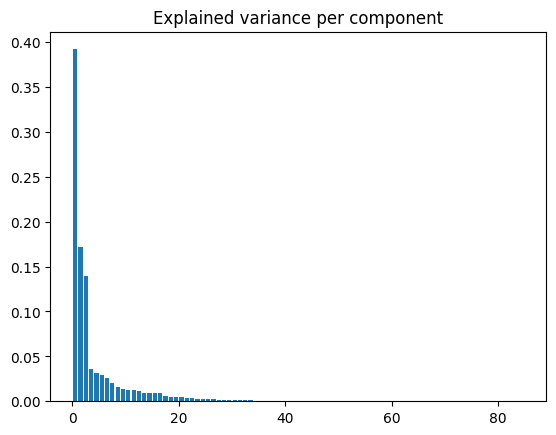

In [29]:

plt.bar(np.arange(len(acp.explained_variance_ratio_)) + 0.5,
        acp.explained_variance_ratio_)
plt.title("Explained variance per component")

Analyse plus détaillée:

In [30]:
print("Analyse ten first components:")
for x in range(10):
    print(f"The {x+1} first axes expain {sum(acp.explained_variance_ratio_[:x+1])*100:.2f}% of total variance")

Analyse ten first components:
The 1 first axes expain 39.21% of total variance
The 2 first axes expain 56.35% of total variance
The 3 first axes expain 70.29% of total variance
The 4 first axes expain 73.86% of total variance
The 5 first axes expain 77.00% of total variance
The 6 first axes expain 79.98% of total variance
The 7 first axes expain 82.58% of total variance
The 8 first axes expain 84.58% of total variance
The 9 first axes expain 86.15% of total variance
The 10 first axes expain 87.50% of total variance


We only keep the first 10 components because it allows to contain almost 90% of the explained variance, which is more than enough. We store the contributions to each component in the following dataframe:

In [31]:
acp = PCA(n_components=10)
components=acp.fit_transform(X_normalise)
components_df = pd.DataFrame(components,columns=[f'pca_{i}' for i in range(1,11)]) 
components_df.head(10)

,pca_1,pca_2,pca_3,pca_4,pca_5,pca_6,pca_7,pca_8,pca_9,pca_10
0,-0.297443,-0.426294,0.400700,0.280842,-0.039113,0.092864,0.009101,0.014778,0.032657,0.086370
1,-0.661182,-0.330635,0.421660,0.274579,-0.047218,0.098286,0.013318,0.014989,0.031080,0.085277
2,7.776721,-2.129598,0.048270,0.345032,-0.085109,0.227592,0.027492,-0.065931,0.149192,0.906348
3,0.392490,0.678801,-1.160178,-1.167267,0.770215,0.572416,-3.032327,2.317649,-0.517915,1.086984
4,-0.802367,-0.292383,0.430428,0.275116,-0.051952,0.104455,0.013822,0.011482,0.034108,0.120967
5,0.860685,-0.730654,0.332434,0.296720,-0.013138,0.072325,-0.003581,0.014640,0.035569,0.072665
6,-0.498014,-0.370603,0.412659,0.281990,-0.047453,0.103751,0.009086,0.006316,0.039419,0.163058
7,-0.648499,-0.332955,0.421334,0.277071,-0.048297,0.101366,0.012208,0.011861,0.034191,0.115375
8,0.086205,-0.215536,0.537847,0.284654,0.012786,0.035831,-0.021211,0.013445,0.031418,-0.035190
9,-0.636819,-0.335756,0.420621,0.277491,-0.048382,0.101761,0.011876,0.011065,0.034795,0.121709


#### PCA: Representation of municipalities in a 2-dimensional space

In [32]:
pca_graph(X_normalise,geo_variables["LIBGEO"])

##### Interpretation of the graph:

Given the large number of observations, the interpretation is not obvious as can be seen from the previous graph. However, we can still notice observations that deviate from the homogeneous group of points. Typically, Marseille is on the extreme right, Paris is at the top, and Nice, Nantes, Bordeaux are rather close but far from the main group. How can we interpret the previous graph?
What may be interesting is to look at the individual contributions of each individual, for each variable, to each component (so for 2).

#### PCA: Explanation of the first two components of PCA

- Correlation circle of the variables in the base with the first 2 components: A correlation circle is a visual tool used to graphically represent the correlations between different variables in a dataset. When using the first two principal components of a dataset, the correlation circle allows to visualize the relative importance of each variable and to see how they are related to each other.

- Correlations of the variables in the base with the first 2 components: Same principle as the circle but it details more the correlation existing between a variable and each of the axis.

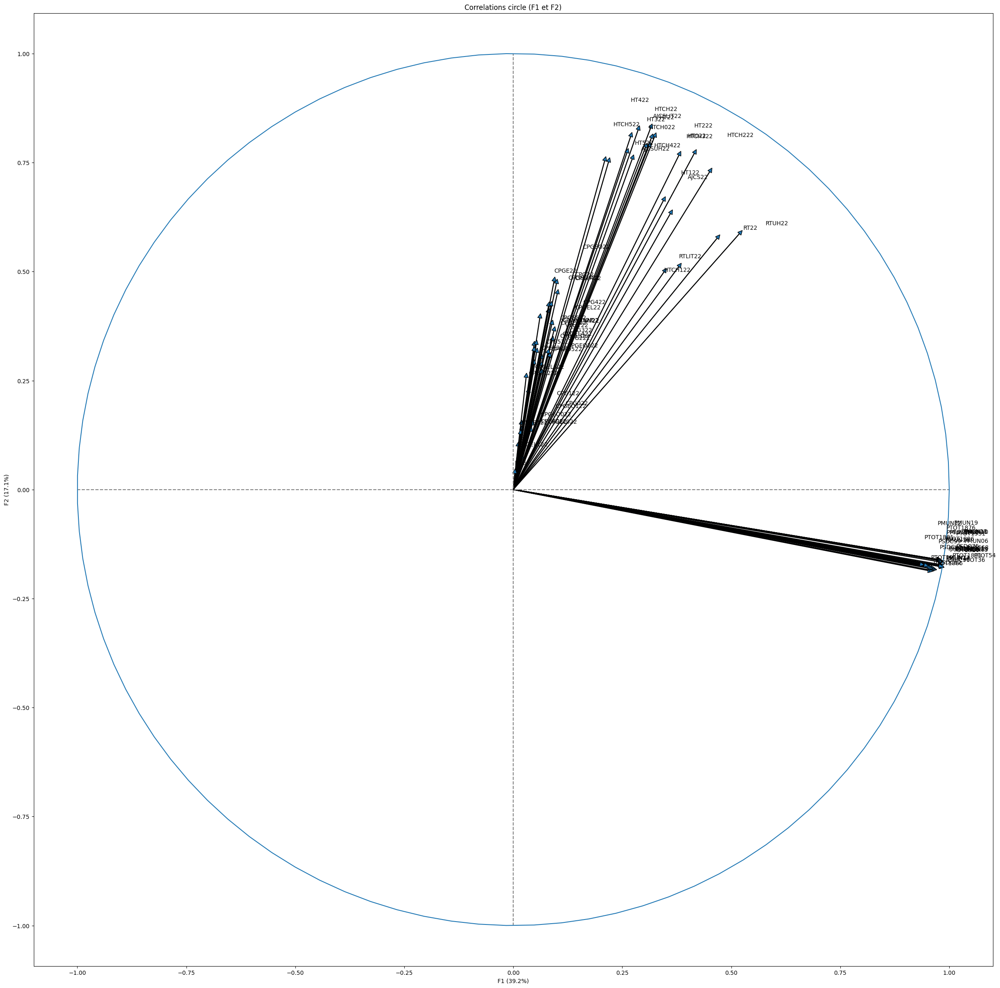

In [33]:
get_correlation_circle_2_components(X_normalise,base_with_all_features)


In [34]:
pd.set_option('display.max_rows', 500)
features_corr_for_2_components(X_normalise,components_df,base_with_all_features)


,id,corr_axe1,corr_axe2
0,HT22,0.315107,0.829574
1,HT022,0.380068,0.767075
2,HT122,0.344432,0.663087
3,HT222,0.415322,0.771191
4,HT322,0.286419,0.825189
5,HT422,0.269232,0.809838
6,HT522,0.218548,0.751697
7,HTCH22,0.323973,0.809182
8,HTCH022,0.311054,0.787591
9,HTCH122,0.345980,0.499492


In [35]:
pd.set_option('display.max_rows', 20) 


The table and correlation circle allow to examine the individual correlations between each variable and the two components:

The first component is strongly correlated with variables related to population and, to a lesser extent, with variables related to hotels. The second component is strongly correlated with variables related to hotels, but also with variables related to camping; youth hostels (to a lesser extent). This indicates that the first component can be used to represent population and potential economic aspect of the place, while the second component can be used to represent tourism.





In [36]:
pca_graph(X_normalise,geo_variables["LIBGEO"])

##### Interpretation:
After explaining the content of the two main components, we can now return to the graph to interpret it.

The higher a town is on the plan, the higher the value for its component 2 => tourist accommodation capacity
The more a town is located to the right on the plan, the higher the value for its component 1 => population + economic center
If we return to the different groups existing on this graph, we have:

- Paris
- Marseille
- Nice, Bordeaux, Toulouse, Nantes
- Aix-en-Provence, Caen, Besançon, Nîmes, Dijon, Grenoble, Rennes, Montpellier, Narbonne, La Rochelle, etc..
- Lyon, Agde, Argelès on Mer


Based on the previous explanations, the results of the PCA are quite satisfactory:

- Paris, at the top, is a city with a strong tourist accommodation capacity, which is logical given its popularity among travelers.
Marseille, located at the extreme of Paris: it is a very heavily populated city but with moderate tourist accommodation capacity, which is quite coherent (many residents but few tourists).
- Nice, Bordeaux, Toulouse, Nantes: this grouping can be characterized by a relatively strong population (these metropolises are among the largest cities in France so it is coherent) and moderate tourist accommodation capacity.
- Aix-en-Provence, Caen, Besançon, Nîmes, Dijon, Grenoble, Rennes, Montpellier, Narbonne, La Rochelle, etc: These are cities that are rather populated and with moderate tourist accommodation capacity due to their proximity to the coast and the mountains.
- Agde, Argelès sur Mer etc..: towns with a strong tourist accommodation capacity, and potentially camping towns since this group is characterized by coastal towns.
- The rest of the towns: sparsely populated and with low tourist accommodation capacity compared to the different groups mentioned.

The limitations of PCA:

- Paris is poorly represented in terms of population even though it is still the capital and the most populous city in France.
- Lille, Lyon, and certain districts of Paris (which were considered differently from "Paris") are crushed and are not distinguishable from the rest of the towns while Lyon is the 3rd largest city in France.
- Cities like Nice, Bordeaux are represented very low in terms of tourist accommodation capacity while they probably have more of this type of accommodation than the "basic" town group.

## Clustering

- Propose and implement a clustering method on the dataset.
- Explain all the steps of your approach.
- Justify your choice of number of clusters.
- Interpret the obtained clusters.
- Represent the towns on the first two axes of your PCA with color mapping based on the cluster.

##### K-Means

K-means is a clustering algorithm used to divide a set of data into a pre-defined number of clusters (k). The goal is to separate the data in such a way that the points in the same cluster are as close as possible to each other, while points belonging to different clusters are as far apart as possible.

To accomplish this, the K-means algorithm uses an iterative approach:

- Choose k random points from the data, called "centroids".
- Assign each data point to the cluster whose centroid is closest.
- Recalculate the centroids of the clusters by taking the mean of all points assigned to it.
- Repeat steps 2 and 3 until the clusters no longer change or until a maximum number of iterations is reached.

#### Elbow method to determine optimal number of clusters
The elbow method is a technique used to determine the optimal number of clusters to use in a clustering algorithm. It involves plotting a graph representing the sum of intra-cluster distances (SSE, sum of squared errors) versus the number of clusters. The SSE measures the homogeneity of the clusters, that is, how close the points in the same cluster are to each other.
On the graph, we look for an "elbow" on the curve, which corresponds to a point where adding an additional cluster no longer results in a significant reduction of the SSE.
Here, we can say that the optimal number of clusters is 4/5. Note, this would be consistent with the PCA graph (we will confirm this later).

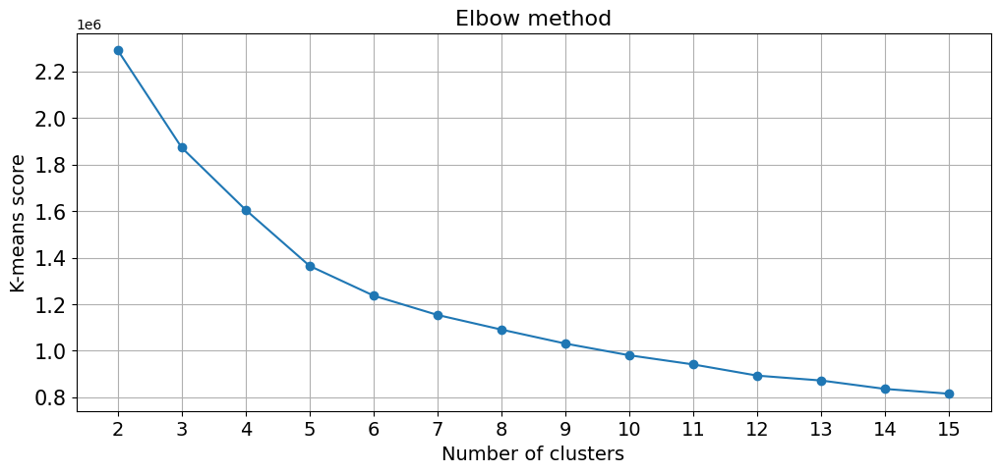

In [39]:
kmeans_graph(X_normalise)

##### Clusters analysis
Wz fix the number of cluster to 5 and analyse results.

In [40]:

kmeans = KMeans(n_clusters=5)
kmeans.fit(X_normalise)
preds = kmeans.predict(X_normalise) 
print("CLUSTERS SIZE:")
for cluster in range(5):
    print(f"Observations for cluster {cluster+1}  : {sum(preds==cluster)}")

CLUSTERS SIZE:
Observations for cluster 1  : 34858
Observations for cluster 2  : 14
Observations for cluster 3  : 1
Observations for cluster 4  : 109
Observations for cluster 5  : 1


In [41]:
df_with_clusters=base_with_all_features.assign(cluster=preds)
print("MEAN CARACTERISTICS PER CLUSTER:")
display(df_with_clusters.groupby("cluster").mean())

MEAN CARACTERISTICS PER CLUSTER:


,HT22,HT022,HT122,HT222,HT322,HT422,HT522,HTCH22,HTCH022,HTCH122,...,PTOT1926,PTOT1921,PTOT1911,PTOT1906,PTOT1901,PTOT1896,PTOT1891,PTOT1886,PTOT1881,PTOT1876
cluster,,,,,,,,,,,,,,,,,,,,,
0,0.445866,0.115296,0.008865,0.098026,0.158414,0.054679,0.010586,16.980923,2.490332,0.323140,...,616.225888,613.589248,684.369126,695.573584,699.387630,709.011418,722.333381,736.216650,738.430948,744.173074
1,52.928571,6.857143,1.571429,11.071429,20.071429,11.785714,1.571429,3023.142857,207.642857,55.214286,...,123091.642857,117989.214286,112883.357143,108733.428571,105692.071429,100508.214286,97875.285714,92621.642857,87655.214286,83335.000000
2,1585.000000,165.000000,23.000000,160.000000,688.000000,456.000000,93.000000,84023.000000,6914.000000,588.000000,...,429.000000,434.000000,502.000000,511.000000,515.000000,528.000000,543.000000,559.000000,566.000000,578.000000
3,8.036697,1.422018,0.183486,1.853211,3.183486,1.073394,0.321101,240.091743,25.559633,3.266055,...,1544.568807,1496.981651,1587.844037,1558.431193,1566.834862,1537.559633,1545.660550,1544.807339,1511.091743,1410.788991
4,106.000000,27.000000,2.000000,19.000000,33.000000,21.000000,4.000000,7133.000000,672.000000,116.000000,...,652196.000000,586341.000000,550619.000000,517498.000000,491161.000000,442239.000000,403749.000000,376143.000000,360099.000000,318868.000000


In [42]:
pca_graph_clusters(X_normalise,geo_variables["LIBGEO"],preds)

The groups found with the PCA are consistent with the clusters. 
However, this allows us to qualify the PCA, as we can see that observations such as Lyon join groups of cities that are well represented in terms of population. We therefore end up with better defined clusters:
- Paris: very populated and very touristy
- Marseille: very populated but not very touristy
- Highly populated cities (more economic than tourist centres): Toulouse, Aix, Brest, Bordeaux, Nantes 
- Tourist and rather populated cities: Lyon, Cannes, La Rochelle, etc. (coastal or mountain) + the rest of the communes
- Small" municipalities exclusively around the sea (predominantly campsites)


The limits of our analysis: 
Even if some of them are distinguished by their tourist accommodation capacity and by their population, which is well reflected by the clusters found, we can see that some observations, notably Lyon and Lille, are poorly represented. But this is not necessarily due to the CPA, since the Kmeans classify Lyon and Lille as belonging to the majority of municipalities, whereas they should, in all logic, be distinguished from the rest. Furthermore, on axis 2, the large cities are rather poorly represented because they probably have better tourist accommodation capacities than the majority of French communes. 

In any case, what may explain the poor representation of individuals on this graph may be the fact that only 56% of the variance of the variables is explained by the first two axes.

## ML

- Propose and implement a model that predicts the electricity consumption of municipalities in agriculture, industry and residential.
- Explain all the steps of your approach.
### General approach
- Define the problem:

 Do we want to predict consumption from all the variables in the dataset?  Indeed, it is not necessarily logical to predict electricity consumption if we have the total consumption and the consumption of the other sectors (total consumption - tertiary consumption - industrial consumption - residential consumption = agri consumption...) The approach to adopt would perhaps be to use the database only to recover the target, and possibly the characteristics of the sector. Perhaps leave other sectors with it, but if we use common sense we don't leave the total consumption...
 
- Quickly explore the database and clean it up (missing values, outliers, etc.)
- Test a simple OLS regression model: Analysis of linear relationships between variables.
- Do feature engineering using features from other databases if necessary 
- Test different models: OLS with new variables, set methods, and other types of regression more adapted to our data





In [43]:

display(base_electricite.head(10))
print("Initial features:",base_electricite.columns.tolist())
print()

print("Observations per year:",base_electricite["annee"].value_counts())


,operateur,annee,filiere,consoa,pdla,nombre_maille_secretisees_a,indquala,consoi,pdli,nombre_maille_secretisees_i,...,libelle_commune,code_epci,libelle_epci,code_departement,libelle_departement,code_region,libelle_region,id_filiere,consototale,code_postal
0,Coopérative d'électricité de Saint Martin de L...,2021,Electricité,96.656000,12,0,0.420,0.000000,0,1,...,Mas-de-Londres,200022986,CC du Grand Pic Saint-Loup,34,Hérault,76,Occitanie,100,2580.085000,34380
1,Coopérative d'électricité de Saint Martin de L...,2021,Electricité,114.528000,12,0,0.564,561.731000,36,0,...,Montarnaud,243400694,CC Vallée de l'Hérault,34,Hérault,76,Occitanie,100,15923.797000,34570
2,Coopérative d'électricité de Saint Martin de L...,2021,Electricité,238.387000,33,0,0.621,2849.502000,36,0,...,Paulhan,243400355,CC du Clermontais,34,Hérault,76,Occitanie,100,18348.188000,34230
3,Coopérative d'électricité de Saint Martin de L...,2021,Electricité,0.000000,0,1,0.000,0.000000,0,1,...,Popian,243400694,CC Vallée de l'Hérault,34,Hérault,76,Occitanie,100,1230.762000,34230
4,Coopérative d'électricité de Saint Martin de L...,2021,Electricité,95.729000,14,0,0.560,0.000000,0,1,...,Puéchabon,243400694,CC Vallée de l'Hérault,34,Hérault,76,Occitanie,100,2172.443000,34150
5,Enedis,2021,Electricité,0.000000,0,1,0.000,0.000000,0,0,...,Cherville,200066876,CA de Châlons-en-Champagne,51,Marne,44,Grand Est,100,313.920162,51150
6,Enedis,2021,Electricité,28.485463,2,0,0.949,509.147833,1,0,...,Cloyes-sur-Marne,200042992,CC Perthois-Bocage et Der,51,Marne,44,Grand Est,100,1075.174478,51300
7,Enedis,2021,Electricité,0.000000,0,1,0.000,0.000000,0,0,...,Coizard-Joches,200066850,CC des Paysages de la Champagne,51,Marne,44,Grand Est,100,531.680950,51270
8,Enedis,2021,Electricité,446.728540,22,0,0.784,23661.576503,3,1,...,Val-des-Marais,200067684,"CA Épernay, Coteaux et Plaine de Champagne",51,Marne,44,Grand Est,100,28231.636558,51130/51130/51130/51130
9,Enedis,2021,Electricité,0.000000,0,1,0.000,0.000000,0,1,...,Compertrix,200066876,CA de Châlons-en-Champagne,51,Marne,44,Grand Est,100,3579.733457,51510


Initial features: ['operateur', 'annee', 'filiere', 'consoa', 'pdla', 'nombre_maille_secretisees_a', 'indquala', 'consoi', 'pdli', 'nombre_maille_secretisees_i', 'indquali', 'consot', 'pdlt', 'nombre_maille_secretisees_t', 'indqualt', 'consor', 'pdlr', 'nombre_maille_secretisees_r', 'indqualr', 'thermor', 'partr', 'consona', 'pdlna', 'nombre_maille_secretisees_na', 'indqualna', 'code_commune', 'libelle_commune', 'code_epci', 'libelle_epci', 'code_departement', 'libelle_departement', 'code_region', 'libelle_region', 'id_filiere', 'consototale', 'code_postal']

Observations per year: 2021    46584
Name: annee, dtype: int64


### Preprocessing
Main stages:
- Filtering for the electricity sector (excluding gas)
- Removal of geographical variables and variables concerning the unknown sector (ending with na)
- Type processing and discretisation of the number of grid cells according to the consumption score provided with the database

A quick study is made of the relationships between the variables in the database. Even if we have to make a model by sector, it is possible that the variables between sectors can be correlated with the electricity consumption of other sectors. 
Note: one of the variables is already certain to be significant: total consumption. The consumption of agriculture is part of the total consumption, so it is logical that this can explain the consumption of a particular sector.

In [44]:
base_electricite=base_electricite[base_electricite["filiere"]=="Electricité"]
base_electricite.drop(columns=["annee","filiere","operateur","libelle_commune","libelle_epci","libelle_departement","code_departement","libelle_region","code_region","id_filiere","code_epci","code_postal","nombre_maille_secretisees_na","pdlna","consona","indqualna"],inplace=True)

In [45]:
base_electricite.describe()


,consoa,pdla,nombre_maille_secretisees_a,indquala,consoi,pdli,nombre_maille_secretisees_i,indquali,consot,pdlt,nombre_maille_secretisees_t,indqualt,consor,pdlr,nombre_maille_secretisees_r,indqualr,thermor,partr,consototale
count,36145.000000,36145.000000,36145.000000,36145.000000,3.614500e+04,36145.000000,36145.000000,36145.000000,3.614500e+04,36145.000000,36145.000000,36145.000000,36145.000000,36145.000000,36145.000000,36145.000000,36145.000000,36145.000000,3.614500e+04
mean,197.039287,7.422410,0.480952,0.477265,3.210984e+03,9.801688,0.555872,0.431320,3.854460e+03,123.363480,0.198312,0.668065,4691.928449,990.015714,0.028690,0.703021,0.472265,6.300819,1.204526e+04
std,611.036556,13.910074,0.897946,0.418887,3.757823e+04,45.457424,1.372167,0.447745,2.329223e+04,779.901234,0.404931,0.324467,16117.263139,4872.881937,0.183666,0.199439,2.011505,11.045248,5.738082e+04
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00
25%,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,6.756885e+01,9.000000,0.000000,0.628000,609.766613,102.000000,0.000000,0.691000,0.000000,0.000000,9.027364e+02
50%,61.000000,2.000000,0.000000,0.664000,3.800000e-01,1.000000,0.000000,0.000000,2.457876e+02,20.000000,0.000000,0.812000,1452.396151,226.000000,0.000000,0.774000,0.000000,0.000000,2.215402e+03
75%,179.778413,10.000000,1.000000,0.880000,3.717210e+02,4.000000,1.000000,0.904000,1.171840e+03,54.000000,0.000000,0.873000,3646.844873,571.000000,0.000000,0.811000,0.286608,15.800000,6.572955e+03
max,34240.956125,519.000000,43.000000,1.000000,4.361012e+06,3021.000000,49.000000,2.000000,1.285811e+06,43139.000000,4.000000,1.000000,909274.759871,298246.000000,5.000000,1.000000,110.015237,84.400000,4.450020e+06


We notice the presence of extreme values. For the time being, we will not deal with this problem but it is important to underline the fact that extreme values can affect the quality of the prediction of a typical regression model. 

#### Type treatment  
We notice that 'nombre de mailles' are integers. However, according to the report on annual electricity consumption, this variable should be considered as categorical. 0 => No delivery point, 1 => Secretised (not available), Others=> Informed and discrete. 
######  We decide to discretise it: 
###### * IF 0 => grp1
###### * IF 1 => grp2
###### * IF Autres => grp3

In [46]:
base_electricite.dtypes

consoa                         float64
pdla                             int64
nombre_maille_secretisees_a      int64
indquala                       float64
consoi                         float64
pdli                             int64
nombre_maille_secretisees_i      int64
indquali                       float64
consot                         float64
pdlt                             int64
nombre_maille_secretisees_t      int64
indqualt                       float64
consor                         float64
pdlr                             int64
nombre_maille_secretisees_r      int64
indqualr                       float64
thermor                        float64
partr                          float64
code_commune                    object
consototale                    float64
dtype: object

In [47]:
#Discretisation of variables "nombre de mailles..."
var_secret=["nombre_maille_secretisees_a","nombre_maille_secretisees_i","nombre_maille_secretisees_t","nombre_maille_secretisees_r"]
base_electricite[var_secret]=base_electricite[var_secret].applymap(create_mod_for_secretisees)
base_electricite=pd.concat([base_electricite,pd.get_dummies(base_electricite[var_secret],drop_first=True)],axis=1)
base_electricite.drop(columns=var_secret,inplace=True) 

#### Correlation analysis
In general, the correlated variables come from the same sector (consor and thermor) but this should be retained if the target is one of the correlated variables (we are looking for correlation with the target and not between the variables). The exception is the presence of correlations between the tertiary and residential sectors, which could cause multicollinearity and potentially spurious relationships in a linear model. 




<AxesSubplot: >

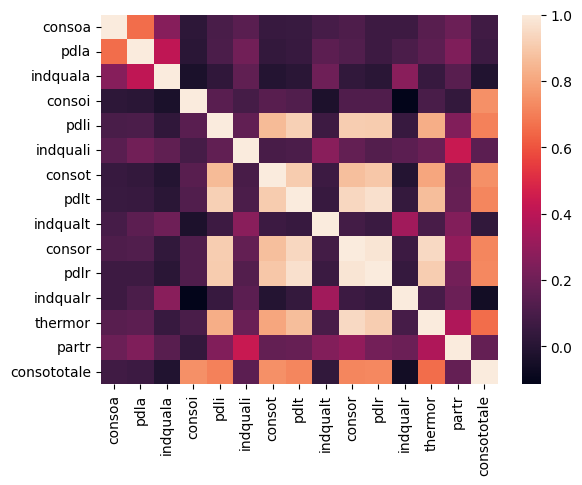

In [48]:
quant_features = [col for col in base_electricite if (not col.startswith('nombre') and not col.startswith("code"))]
sns.heatmap(base_electricite[quant_features].corr())

In [49]:
to_drop=[]
to_drop=erase_correlated_var(base_electricite)
to_drop=[variable for variable in to_drop if not variable.startswith("cons")] # Be careful to not drop targets (cons...)
#base_electricite=base_electricite.drop(columns=to_drop)

High correlated variables: ['pdlt', 'consor', 'pdlr', 'thermor']


/Users/luciegabagnou/Documents/MOSEF/DATAMINING/projet/data-mining-project/scripts/functions.py:150: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



At this stage, it is difficult to find a suitable solution to deal with multicollinearity as the variables that may cause multicollinearity seem to be important in the model, especially for industry and residential. We will therefore address the problem of multicollinearity in the modelling.

##### Missing values treatment
It seems there are not missing values but we treat it by filling with median (just in case).


In [50]:
missing_rate_report(base_electricite)

,count,rate
consoa,0,0.0
pdla,0,0.0
nombre_maille_secretisees_r_grp_2,0,0.0
nombre_maille_secretisees_t_grp_3,0,0.0
nombre_maille_secretisees_t_grp_2,0,0.0
...,...,...
indquali,0,0.0
pdli,0,0.0
consoi,0,0.0
indquala,0,0.0


In [51]:
base_electricite=base_electricite.fillna(base_electricite.median())

/var/folders/wc/46qsbhjx40lf12wjbnjcyx680000gn/T/ipykernel_1363/1558036113.py:1: FutureWarning:

The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



#### Considering outliers

In [52]:
base_electricite.describe()

,consoa,pdla,indquala,consoi,pdli,indquali,consot,pdlt,indqualt,consor,...,partr,consototale,nombre_maille_secretisees_a_grp_2,nombre_maille_secretisees_a_grp_3,nombre_maille_secretisees_i_grp_2,nombre_maille_secretisees_i_grp_3,nombre_maille_secretisees_t_grp_2,nombre_maille_secretisees_t_grp_3,nombre_maille_secretisees_r_grp_2,nombre_maille_secretisees_r_grp_3
count,36145.000000,36145.000000,36145.000000,3.614500e+04,36145.000000,36145.000000,3.614500e+04,36145.000000,36145.000000,36145.000000,...,36145.000000,3.614500e+04,36145.000000,36145.000000,36145.000000,36145.000000,36145.000000,36145.000000,36145.000000,36145.000000
mean,197.039287,7.422410,0.477265,3.210984e+03,9.801688,0.431320,3.854460e+03,123.363480,0.668065,4691.928449,...,6.300819,1.204526e+04,0.385724,0.025564,0.412256,0.026449,0.194965,0.001439,0.025093,0.001494
std,611.036556,13.910074,0.418887,3.757823e+04,45.457424,0.447745,2.329223e+04,779.901234,0.324467,16117.263139,...,11.045248,5.738082e+04,0.486773,0.157832,0.492248,0.160469,0.396179,0.037903,0.156411,0.038624
min,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,6.756885e+01,9.000000,0.628000,609.766613,...,0.000000,9.027364e+02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,61.000000,2.000000,0.664000,3.800000e-01,1.000000,0.000000,2.457876e+02,20.000000,0.812000,1452.396151,...,0.000000,2.215402e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,179.778413,10.000000,0.880000,3.717210e+02,4.000000,0.904000,1.171840e+03,54.000000,0.873000,3646.844873,...,15.800000,6.572955e+03,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,34240.956125,519.000000,1.000000,4.361012e+06,3021.000000,2.000000,1.285811e+06,43139.000000,1.000000,909274.759871,...,84.400000,4.450020e+06,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [53]:
#Note: we delete indquali outliers because it is an error: the index cannot take the value 2 knowing that the score is between 0 and 1
base_electricite = base_electricite.loc[base_electricite["indquali"] != 2]

In [54]:
# Sample of extreme values
base_electricite[base_electricite["consoa"]==34240.9561247]

,consoa,pdla,indquala,consoi,pdli,indquali,consot,pdlt,indqualt,consor,...,code_commune,consototale,nombre_maille_secretisees_a_grp_2,nombre_maille_secretisees_a_grp_3,nombre_maille_secretisees_i_grp_2,nombre_maille_secretisees_i_grp_3,nombre_maille_secretisees_t_grp_2,nombre_maille_secretisees_t_grp_3,nombre_maille_secretisees_r_grp_2,nombre_maille_secretisees_r_grp_3
5689,34240.956125,11,0.876,212.983067,13,0.893,6801.462893,91,0.862,6568.784766,...,37242,47824.186851,0,0,0,0,0,0,0,0


##### Targets
Note that the scales of the variables are different. Thus an average prediction gap of 2000 for each of the targets does not mean the same thing:
- The values for agricultural consumption range from 0 to 34240.956125, with the median at 61
- Industrial consumption values range from 0 to 4361012 with a median of 0.38
- Industrial consumption values range from 0 to 909274.759871 with a median of 1452.396151


We can see that the deviation from the actual data (std) is very high so it might be difficult to have reliable predictions. To understand this, we can imagine the opposite case: if the deviation is low, it means that the actual values are relatively close to each other, which can make the prediction easier.

In [55]:
base_electricite[["consoa","consoi","consor"]].describe()

,consoa,consoi,consor
count,36144.000000,3.614400e+04,36144.000000
mean,196.977923,3.211071e+03,4691.933344
std,610.933623,3.757875e+04,16117.486076
min,0.000000,0.000000e+00,0.000000
25%,0.000000,0.000000e+00,609.757008
50%,60.994547,3.775000e-01,1452.357033
75%,179.765441,3.717511e+02,3646.389042
max,34240.956125,4.361012e+06,909274.759871


##### Methodology for extreme values
Extreme values are present both on the targets and on the other variables of the dataset. Thus, to deal with this problem, which can affect the quality of the regression, we have different solutions:
- Run a first regression and see the quality of the results (+ Ridge since there is multicollinearity)
- Use transformations of variables (typically logarithmic) that attenuate extreme values
- Discretize continuous variables and integrate extreme values into buckets (for explanatory variables)
- Use ensemble methods, which are less sensitive to outliers than linear regressions OR test outlier-corrected linear regression models.

In order to get the best results, we will test different things:
- Simple modelling to understand how much outliers affect the quality of the prediction
- Outlier-corrected linear regression and set-up methods

### Modelling
Two approaches:
- Naive approach on the electricity consumption dataset (on features on electricity consumption) with the risk that the total consumption makes all the variability of the model / variant: remove the total consumption 
- Approach 2: Try to add new features to the database

### Naive approach on the basis of electricity consumption data
In this section, we only run one model: Linear regression with L2 penalty (tested without also but we keep only this version). Indeed, linear regression is a simple model but it allows to easily understand a regression problem. Whether it is by looking at the coefficient of determination, the AIC, or metrics such as MAE (predictive quality), it gives us an idea of how well the linear model fits our data. We have added an L2 (Ridge) penalty to take into account the multicollinearity of our model. This parameter is determined by GridSearch in the OLS_reports function (grid_search_ridge_penalisation).

Note: The results shown for OLS do not take into account the Ridge 

In [56]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite,"consoa")


Index(['pdla', 'indquala', 'consoi', 'pdli', 'indquali', 'consot', 'pdlt',
       'indqualt', 'consor', 'pdlr', 'indqualr', 'thermor', 'partr',
       'consototale', 'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3'],
      dtype='object')


In [57]:
OLS_reports(X_train,X_test,y_train,y_test,"consoa",ridge=True)

OLS results for consoa
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.543
Model:                            OLS   Adj. R-squared (uncentered):              0.543
Method:                 Least Squares   F-statistic:                              1466.
Date:                Fri, 13 Jan 2023   Prob (F-statistic):                        0.00
Time:                        09:19:03   Log-Likelihood:                     -2.0371e+05
No. Observations:               27108   AIC:                                  4.075e+05
Df Residuals:                   27086   BIC:                                  4.077e+05
Df Model:                          22                                                  
Covariance Type:            nonrobust                                                  
                                        coef    std err          t      P>|t|      [0.025      0.

Ridge(alpha=100)

In [58]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite,"consoi")
OLS_reports(X_train,X_test,y_train,y_test,"consoi",ridge=True)

Index(['consoa', 'pdla', 'indquala', 'pdli', 'indquali', 'consot', 'pdlt',
       'indqualt', 'consor', 'pdlr', 'indqualr', 'thermor', 'partr',
       'consototale', 'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3'],
      dtype='object')
OLS results for consoi
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                          1.668e+06
Date:                Fri, 13 Jan 2023   Prob (F-statistic):                        0.00
Tim

Ridge(alpha=0.001)

In [59]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite,"consor")
OLS_reports(X_train,X_test,y_train,y_test,"consor",ridge=True)

Index(['consoa', 'pdla', 'indquala', 'consoi', 'pdli', 'indquali', 'consot',
       'pdlt', 'indqualt', 'pdlr', 'indqualr', 'thermor', 'partr',
       'consototale', 'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3'],
      dtype='object')
OLS results for consor
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.995
Model:                            OLS   Adj. R-squared (uncentered):              0.995
Method:                 Least Squares   F-statistic:                          2.562e+05
Date:                Fri, 13 Jan 2023   Prob (F-statistic):                        0.00
Tim

Ridge(alpha=100)

- If we look at the predictive power of the previous models, the performance is more than satisfactory. The average error is rather low (MAE) due to the presence of total consumption among the variables. Moreover, the R2 is very high for the industry and residential models, but this may be due to the variability explained by the total consumption. 
- On the other hand, if we think about the rationality and explanatory power of these models, this model is not relevant. Indeed, there is no logic in having to predict the consumption of agriculture if we have all the other consumptions as well as the final consumption.


### Without the total consumption?
One of the reasons the model is so good is that most of the variability in the model (R2) has to come from one variable: total consumption. What if we remove this variable? 


In [60]:
base_electricite_without_consotot=base_electricite.drop(columns="consototale")

In [61]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite_without_consotot,"consoa")
OLS_reports(X_train,X_test,y_train,y_test,"consoa",ridge=True)

Index(['pdla', 'indquala', 'consoi', 'pdli', 'indquali', 'consot', 'pdlt',
       'indqualt', 'consor', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3'],
      dtype='object')
OLS results for consoa
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.459
Model:                            OLS   Adj. R-squared (uncentered):              0.459
Method:                 Least Squares   F-statistic:                              1096.
Date:                Fri, 13 Jan 2023   Prob (F-statistic):                        0.00
Time:             

Ridge(alpha=100)

In [62]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite_without_consotot,"consoi")
OLS_reports(X_train,X_test,y_train,y_test,"consoi",ridge=True)

Index(['consoa', 'pdla', 'indquala', 'pdli', 'indquali', 'consot', 'pdlt',
       'indqualt', 'consor', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3'],
      dtype='object')
OLS results for consoi
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.056
Model:                            OLS   Adj. R-squared (uncentered):              0.056
Method:                 Least Squares   F-statistic:                              77.14
Date:                Fri, 13 Jan 2023   Prob (F-statistic):                   5.08e-321
Time:             

Ridge(alpha=100)

In [63]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite_without_consotot,"consor")
OLS_reports(X_train,X_test,y_train,y_test,"consor",ridge=True)

Index(['consoa', 'pdla', 'indquala', 'consoi', 'pdli', 'indquali', 'consot',
       'pdlt', 'indqualt', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3'],
      dtype='object')
OLS results for consor
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.985
Model:                            OLS   Adj. R-squared (uncentered):              0.985
Method:                 Least Squares   F-statistic:                          8.698e+04
Date:                Fri, 13 Jan 2023   Prob (F-statistic):                        0.00
Time:             

Ridge(alpha=10)

It can be seen that if final consumption is removed, the performance is very poor. For agriculture, the results are better but not good: 140 kwh of prediction error is "high" given the values taken by the variable at the origin. 
Remark: the original values have extreme values very far from the median, which could have an impact on the predictive quality of the model (as said before). Thus, even if the R2 of the last model is high, this does not mean that the model predicts well (even if it fits well) and this may be due to the presence of multicollinearity.


### Sector-specific approach
- Initially, we could see the limits of using the initial database only. If we use all the variables, the model is very efficient but not very logical, and if we don't use all the variables, it doesn't give good performances.
- So we will now make joins with other databases that could help us to better predict electricity consumption by sector. First of all, we will try to use the databases at our disposal, otherwise we will add more specific databases.

In [64]:
base_electricite_without_consotot=base_electricite.drop(columns="consototale")

We attach our database with elements of our previous analysis, namely the cluster prediction and the population average over the period 1876-2019

In [65]:
base_externe=pd.concat([pd.DataFrame(base_pop_1876_2019.mean(axis=1),columns=["mean_pop"]),pd.Series(preds,name="clusters").astype(str),geo_variables["CODGEO"].astype(str)],axis=1)
base_electricite_externe=pd.merge(left=base_electricite_without_consotot,right=base_externe,left_on="code_commune",right_on="CODGEO",how="left")

/var/folders/wc/46qsbhjx40lf12wjbnjcyx680000gn/T/ipykernel_1363/588012353.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



In [66]:
# Imputation by mode for clusters preds
base_electricite_externe["clusters"]=base_electricite_externe["clusters"].fillna(base_electricite_externe["clusters"].mode()[0])
#One-hot-encoding cluster
base_electricite_externe=pd.concat([base_electricite_externe,pd.get_dummies(base_electricite_externe["clusters"],drop_first=True,prefix='clusters')],axis=1)

# Fillna by median for quantitative featur
for col in base_electricite_externe.select_dtypes(exclude="object"):
    base_electricite_externe[col]=base_electricite_externe[col].fillna(base_electricite_externe[col].median())


In [67]:
#Drop unused columns
base_electricite_externe.drop(columns=["CODGEO","clusters"],inplace=True)

We will test different models for each sector to try to reduce the MAE as much as possible.  As a reminder, the mean absolute error (MAE) is a measure of the performance of a prediction model that measures the average difference between the predicted and actual values. The lower the MAE, the better the performance of the model.

Another measure of model performance that is less sensitive to outliers than the MAE is the Median Absolute Error (MedAE). It measures the difference between predicted and actual values in the following way: it first calculates the absolute errors for each observation and then finds the median of these errors. If the MedAE is low, it means that most of the prediction errors are relatively small.








#### Housing

##### Regression

In [68]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite_externe,"consor")

Index(['consoa', 'pdla', 'indquala', 'consoi', 'pdli', 'indquali', 'consot',
       'pdlt', 'indqualt', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3', 'mean_pop', 'clusters_1',
       'clusters_3'],
      dtype='object')


In [69]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite_externe,"consor")
OLS_reports(X_train,X_test,y_train,y_test,"consor",ridge=True)

Index(['consoa', 'pdla', 'indquala', 'consoi', 'pdli', 'indquali', 'consot',
       'pdlt', 'indqualt', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3', 'mean_pop', 'clusters_1',
       'clusters_3'],
      dtype='object')
OLS results for consor
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.985
Model:                            OLS   Adj. R-squared (uncentered):              0.985
Method:                 Least Squares   F-statistic:                          7.547e+04
Date:                Fri, 13 Jan 2023   Prob (F-statistic):

Ridge(alpha=10)

This model fits the data very well as the R2 is very high but this may be due to multicollinearity.
The performance is not particularly better with the addition of the variables. However, we can see that these variables, especially the clusters, have a significant impact at the 5% level. It will be interesting to keep them. Finally, using a L2 (Ridge) type penalty, the performance is significantly better. This seems to suggest that it is a good method to handle multicollinearity in the model. 

##### XGBoost (Gradient Boosting algorithm)
Gradient boosting is a machine learning algorithm that belongs to the family of ensemble algorithms. It uses several weak prediction models to create a strong prediction model. Gradient boosting works by building a base model and then training another model to correct errors in the base model. This step is repeated several times until a satisfactory final model is obtained.


Using an ensemblistic method can be effective in getting good predictions in the presence of multicollinearity and outliers:

In [70]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite_externe,"consor",scaler=True) #Test with and without scaler

Index(['consoa', 'pdla', 'indquala', 'consoi', 'pdli', 'indquali', 'consot',
       'pdlt', 'indqualt', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3', 'mean_pop', 'clusters_1',
       'clusters_3'],
      dtype='object')


In [71]:
xgb_model=xgb.XGBRegressor()
parameters = {'max_depth': [3,7], 'learning_rate': [0.5,1,1.5],'objective': ['reg:absoluteerror']}
grid_xgb=GridSearchCV(xgb_model,parameters)
#grid_xgb.fit(X_train,y_train)
#print("Best params:",grid_xgb.best_params_)

In [72]:
xgb_model.set_params(**{'learning_rate': 1.5,
 'max_depth': 7,
 'n_estimators': 1000,
 'objective': 'reg:absoluteerror'})

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=1.5, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             objective='reg:absoluteerror', predictor=None, ...)

In [73]:
xgb_model.fit(X_train,y_train)
y_train_pred=xgb_model.predict(X_train)
y_test_pred=xgb_model.predict(X_test)
print("MAE on train: ",metrics.mean_absolute_error(y_train,y_train_pred))
print("MAE on test:",metrics.mean_absolute_error(y_test,y_test_pred))
print()
print("MedAE on train: ",metrics.median_absolute_error(y_train,y_train_pred))
print("MedAE on test: ",metrics.median_absolute_error(y_test,y_test_pred))

MAE on train:  3197.2326923940764
MAE on test: 3112.387394928221

MedAE on train:  160.74170114453125
MedAE on test:  183.60789446796878


##### Alternative regression: RANSAC and Huber
The assembly method gives worse results than the linear regression. We will try to challenge the L2 penalized linear regression by taking into account the extreme values. For this purpose, we use a Huber or RANSAC type regression (https://act6100.netlify.app/ridge_lasso/robustregression). This is a proposal to try to reduce the problem of outliers that can alter the quality of the prediction.
Remark: the implementation of the Huber regression is a linear regression of type L2, it is enough to modify the optimal alpha found previously 


In [74]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite_externe,"consor",scaler=False)  
huberreg= HuberRegressor(alpha=10,max_iter=2000) # Tune alpha if n
huberreg.fit(X_train,y_train)
y_train_pred=huberreg.predict(X_train)
y_test_pred=huberreg.predict(X_test)
print("MAE on train: ",metrics.mean_absolute_error(y_train,y_train_pred))
print("MAE on test:",metrics.mean_absolute_error(y_test,y_test_pred))
print()
print("MedAE on train: ",metrics.median_absolute_error(y_train,y_train_pred))
print("MedAE on test: ",metrics.median_absolute_error(y_test,y_test_pred))

Index(['consoa', 'pdla', 'indquala', 'consoi', 'pdli', 'indquali', 'consot',
       'pdlt', 'indqualt', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3', 'mean_pop', 'clusters_1',
       'clusters_3'],
      dtype='object')
MAE on train:  859.5854681673381
MAE on test: 862.3999361139751

MedAE on train:  286.9842365306681
MedAE on test:  285.733387036988


##### Selected model

The last two models seem to be the best. It all depends on the criterion to be minimised: whether we want a model that predicts better on average or "on median":
- XGBoost turns out to be better at minimising MedAE (MAE on test: 3135.8 & MedAE on test: 190.1)
- Huber Reg is "less bad" at predicting extreme values (MAE on test: 863 & MedAE on test: 276.7)

 In all cases, given the deviation of the "consor" variable, the model is not particularly bad. The second model is less sensitive to outliers.

In [75]:
base_electricite_externe["consor"].describe()

count     36144.000000
mean       4691.933344
std       16117.486076
min           0.000000
25%         609.757008
50%        1452.357033
75%        3646.389042
max      909274.759871
Name: consor, dtype: float64

#### Industry
We do the same for industry

##### Regression

In [76]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite_externe,"consoi")
OLS_reports(X_train,X_test,y_train,y_test,"consoi",ridge=True)

Index(['consoa', 'pdla', 'indquala', 'pdli', 'indquali', 'consot', 'pdlt',
       'indqualt', 'consor', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3', 'mean_pop', 'clusters_1',
       'clusters_3'],
      dtype='object')
OLS results for consoi
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.071
Model:                            OLS   Adj. R-squared (uncentered):              0.070
Method:                 Least Squares   F-statistic:                              85.62
Date:                Fri, 13 Jan 2023   Prob (F-statistic):

Ridge(alpha=100)

The R2 is very low which may suggest that the model does not fit the data at all. The prediction metrics are also not good. However, many variables are significant. Thus, we explore different avenues in the following to try to predict electricity consumption in the industry:
- We will try set methods: the structure of the data is not made for linear regression at first sight (even corrected for multicollinearity).

Rq: The addition of the average population was a wise choice because the variable is significant at the 5% level and its coefficient is very strong.

Rq: Le rajoute de la population moyenne était un choix judicieux car la variable est significative au seuil de 5% et son coefficient est très fort.



##### XGBoost 

In [77]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite_externe,"consoi",scaler=False)

Index(['consoa', 'pdla', 'indquala', 'pdli', 'indquali', 'consot', 'pdlt',
       'indqualt', 'consor', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3', 'mean_pop', 'clusters_1',
       'clusters_3'],
      dtype='object')


In [78]:
xgb_model=xgb.XGBRegressor()
parameters = {'max_depth': [4,7], 'learning_rate': [ 0.1, 0.5,1],'objective': ['reg:absoluteerror'], 'n_estimators': [500],'lambda':[0.01,0.5,1,10]}
grid_xgb=GridSearchCV(xgb_model,parameters)
#grid_xgb.fit(X_train,y_train)
#grid_xgb.best_params_

In [79]:
xgb_model.set_params(**{'lambda': 0.01,
 'learning_rate': 0.5,
 'max_depth': 7,
 'n_estimators': 500,
 'objective': 'reg:absoluteerror'})

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, lambda=0.01, learning_rate=0.5,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             objective='reg:absoluteerror', ...)

In [80]:
xgb_model.fit(X_train,y_train)
y_train_pred=xgb_model.predict(X_train)
y_test_pred=xgb_model.predict(X_test)
print("MAE on train: ",metrics.mean_absolute_error(y_train,y_train_pred))
print("MAE on test:",metrics.mean_absolute_error(y_test,y_test_pred))
print()
print("MedAE on train: ",metrics.median_absolute_error(y_train,y_train_pred))
print("MedAE on test: ",metrics.median_absolute_error(y_train,y_train_pred))

MAE on train:  2913.751578204885
MAE on test: 3824.9036983630517

MedAE on train:  0.0005132853984832764
MedAE on test:  0.0005132853984832764


##### Alternative method

In [81]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite_externe,"consoi",scaler=False)
huberreg= HuberRegressor(max_iter=1000)
huberreg.fit(X_train,y_train)
y_train_pred=huberreg.predict(X_train)
y_test_pred=huberreg.predict(X_test)
print("MAE on train: ",metrics.mean_absolute_error(y_train,y_train_pred))
print("MAE on test:",metrics.mean_absolute_error(y_test,y_test_pred))
print()
print("MedAE on train: ",metrics.median_absolute_error(y_train,y_train_pred))
print("MedAE on test: ",metrics.median_absolute_error(y_train,y_train_pred))

Index(['consoa', 'pdla', 'indquala', 'pdli', 'indquali', 'consot', 'pdlt',
       'indqualt', 'consor', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3', 'mean_pop', 'clusters_1',
       'clusters_3'],
      dtype='object')
MAE on train:  2697.58426573747
MAE on test: 3163.686584769981

MedAE on train:  22.49691239001845
MedAE on test:  22.49691239001845


##### How to further reduce the prediction error?
To reduce prediction error, one last model is tried: the Random Forest. Random Forests may be more robust to outliers than XGBoost, because they use an ensemble of decision models rather than a single decision tree like XGBoost. Random Forests may be less sensitive to prediction errors caused by outliers, as they use the average of the predictions of each model in the ensemble to make the final prediction, which may mitigate the impact of outliers. 

In [82]:
X_train,X_test,y_train,y_test=processing_ml(base_electricite_externe,"consoi",scaler=False)
param_grid = {'n_estimators': [50, 100, 200],
              'max_depth': [ 5, 10],
              'min_samples_split': [2, 5],
              'min_samples_leaf': [1, 2, 5]}

rf = RandomForestRegressor()
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5)
#grid_search.fit(X_train, y_train)

Index(['consoa', 'pdla', 'indquala', 'pdli', 'indquali', 'consot', 'pdlt',
       'indqualt', 'consor', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3', 'mean_pop', 'clusters_1',
       'clusters_3'],
      dtype='object')


In [83]:
rf=RandomForestRegressor(**{'max_depth': 5,
 'min_samples_leaf': 5,
 'min_samples_split': 5,
 'n_estimators': 200})
rf.fit(X_train,y_train)
y_train_pred=rf.predict(X_train)
y_test_pred=rf.predict(X_test)
print("MAE on train: ",metrics.mean_absolute_error(y_train,y_train_pred))
print("MAE on test:",metrics.mean_absolute_error(y_test,y_test_pred))
print()
print("MedAE on train: ",metrics.median_absolute_error(y_train,y_train_pred))
print("MedAE on test: ",metrics.median_absolute_error(y_test,y_test_pred))

MAE on train:  3042.0628445606685
MAE on test: 3093.1698583160237

MedAE on train:  49.87559375907507
MedAE on test:  49.87559375907507


##### Selectioned model

As far as industry is concerned, the best models are those based on set methods: Random Forest and XGBoost. In fact, the data for industry do not allow us to have a satisfactory model with a linear model (either via linear regression, ridge and Huber). The best performance is given by XGBoost which allows us to have a MedAE equal to 0.6 on the test sample. If the objective is to minimise the MedAE, the best model is RandomForest (to within 1000 points). This confirms the intuition that, in the presence of outliers, the Random Forest tends to be better. 

Caution: the performances are conditioned by the tuning of the hyper-parameters so the performances are not necessarily optimal for both models (can be even better).


#### Agriculture
For agriculture, it is proposed to use a database that could be interesting (https://agreste.agriculture.gouv.fr/agreste-web/disaron/G_2002/detail/)
This is a table that describes the technical and economic orientation of farms by municipality of production by municipality. It seems rather logical that, depending on the size of the farms and the type of breeding, the electricity consumption of a farm is more or less high. We will see later if the addition of this table was necessary or not.

In [84]:
display(agri_externe.head(10))

,NOM,ANNREF,FRANCE,FRDOM,REGION,DEP,COM,G_2002_DIM1,G_2002_MOD_DIM1,G_2002_LIB_DIM1,G_2002_DIM2,G_2002_MOD_DIM2,G_2002_LIB_DIM2,G_2002_DIM3,G_2002_MOD_DIM3,G_2002_LIB_DIM3,VALEUR,QUALITE
0,G_2002,2010,FR,............,............,............,............,Champ des exploitations,1,Ensemble des exploitations (hors pacages colle...,Orientation technico-économique (OTEX),1,Ensemble,Indicateur,1,Exploitations,5.146940e+05,OUI
1,G_2002,2010,FR,............,............,............,............,Champ des exploitations,1,Ensemble des exploitations (hors pacages colle...,Orientation technico-économique (OTEX),1,Ensemble,Indicateur,2,Superficie agricole utilisée (ha),2.708779e+07,OUI
2,G_2002,2010,FR,............,............,............,............,Champ des exploitations,1,Ensemble des exploitations (hors pacages colle...,Orientation technico-économique (OTEX),1,Ensemble,Indicateur,3,Unités de travail annuel (UTA),7.855642e+05,OUI
3,G_2002,2010,FR,............,............,............,............,Champ des exploitations,1,Ensemble des exploitations (hors pacages colle...,Orientation technico-économique (OTEX),1,Ensemble,Indicateur,4,Production brute standard (millier d'euros),5.208443e+07,OUI
4,G_2002,2010,FR,............,............,............,............,Champ des exploitations,1,Ensemble des exploitations (hors pacages colle...,Orientation technico-économique (OTEX),2,"Grandes cultures (Otex 15, 16)",Indicateur,1,Exploitations,1.304020e+05,OUI
5,G_2002,2010,FR,............,............,............,............,Champ des exploitations,1,Ensemble des exploitations (hors pacages colle...,Orientation technico-économique (OTEX),2,"Grandes cultures (Otex 15, 16)",Indicateur,2,Superficie agricole utilisée (ha),9.239236e+06,OUI
6,G_2002,2010,FR,............,............,............,............,Champ des exploitations,1,Ensemble des exploitations (hors pacages colle...,Orientation technico-économique (OTEX),2,"Grandes cultures (Otex 15, 16)",Indicateur,3,Unités de travail annuel (UTA),1.427679e+05,OUI
7,G_2002,2010,FR,............,............,............,............,Champ des exploitations,1,Ensemble des exploitations (hors pacages colle...,Orientation technico-économique (OTEX),2,"Grandes cultures (Otex 15, 16)",Indicateur,4,Production brute standard (millier d'euros),9.814394e+06,OUI
8,G_2002,2010,FR,............,............,............,............,Champ des exploitations,1,Ensemble des exploitations (hors pacages colle...,Orientation technico-économique (OTEX),3,"Maraîchage et horticulture (Otex 21, 22)",Indicateur,1,Exploitations,1.631400e+04,OUI
9,G_2002,2010,FR,............,............,............,............,Champ des exploitations,1,Ensemble des exploitations (hors pacages colle...,Orientation technico-économique (OTEX),3,"Maraîchage et horticulture (Otex 21, 22)",Indicateur,2,Superficie agricole utilisée (ha),1.392426e+05,OUI


In [85]:


agri_externe=agri_externe[agri_externe["G_2002_LIB_DIM1"]=="Ensemble des exploitations (hors pacages collectifs)"]
agri_externe=agri_externe[agri_externe["G_2002_LIB_DIM3"].isin(["Superficie agricole utilisée (ha)","Exploitations"])]
agri_externe = agri_externe.pivot_table(index=["COM"], columns=["G_2002_LIB_DIM3", "G_2002_LIB_DIM2"], values="VALEUR")
agri_externe.columns = agri_externe.columns.to_series().str.join('_')
#Merge
base_for_agri_with_ext=pd.merge(left=base_electricite_externe, right=agri_externe, left_on="code_commune",right_on="COM", how='left')
base_for_agri_with_ext=base_for_agri_with_ext.fillna(0)

In [86]:
X_train,X_test,y_train,y_test=processing_ml(base_for_agri_with_ext,"consoa")

Index(['pdla', 'indquala', 'consoi', 'pdli', 'indquali', 'consot', 'pdlt',
       'indqualt', 'consor', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3', 'mean_pop', 'clusters_1',
       'clusters_3', 'Exploitations_Bovins lait (Otex 45)',
       'Exploitations_Bovins mixte (Otex 47)',
       'Exploitations_Bovins viande (Otex 46)',
       'Exploitations_Cultures fruitières et autres cultures permanentes (Otex 36, 37, 38)',
       'Exploitations_Elevages hors sol  (Otex 51, 52, 53, 74)',
       'Exploitations_Ensemble',
       'Exploitations_Grandes cultures (Otex 15, 16)',
       'Exploitations_Maraîchage et horticulture (Otex 21, 22)',
       'Expl

##### Régression

In [87]:
OLS_reports(X_train,X_test,y_train,y_test,"consoa",ridge=True)

OLS results for consoa
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.517
Model:                            OLS   Adj. R-squared (uncentered):              0.516
Method:                 Least Squares   F-statistic:                              629.0
Date:                Fri, 13 Jan 2023   Prob (F-statistic):                        0.00
Time:                        09:22:00   Log-Likelihood:                     -2.0302e+05
No. Observations:               27108   AIC:                                  4.061e+05
Df Residuals:                   27062   BIC:                                  4.065e+05
Df Model:                          46                                                  
Covariance Type:            nonrobust                                                  
                                                                                                 

Ridge(alpha=100)

##### XGBoost


In [88]:
X_train,X_test,y_train,y_test=processing_ml(base_for_agri_with_ext,"consoa")
xgb_model=xgb.XGBRegressor()
parameters = {'max_depth': [5,7], 'learning_rate': [ 0.01, 0.5,1],'objective': ['reg:absoluteerror'], 'n_estimators': [500],'lambda':[0.01,0.5,1]}
grid_xgb=GridSearchCV(xgb_model,parameters)
#grid_xgb.fit(X_train,y_train)
#grid_xgb.best_params_

Index(['pdla', 'indquala', 'consoi', 'pdli', 'indquali', 'consot', 'pdlt',
       'indqualt', 'consor', 'pdlr', 'indqualr', 'thermor', 'partr',
       'nombre_maille_secretisees_a_grp_2',
       'nombre_maille_secretisees_a_grp_3',
       'nombre_maille_secretisees_i_grp_2',
       'nombre_maille_secretisees_i_grp_3',
       'nombre_maille_secretisees_t_grp_2',
       'nombre_maille_secretisees_t_grp_3',
       'nombre_maille_secretisees_r_grp_2',
       'nombre_maille_secretisees_r_grp_3', 'mean_pop', 'clusters_1',
       'clusters_3', 'Exploitations_Bovins lait (Otex 45)',
       'Exploitations_Bovins mixte (Otex 47)',
       'Exploitations_Bovins viande (Otex 46)',
       'Exploitations_Cultures fruitières et autres cultures permanentes (Otex 36, 37, 38)',
       'Exploitations_Elevages hors sol  (Otex 51, 52, 53, 74)',
       'Exploitations_Ensemble',
       'Exploitations_Grandes cultures (Otex 15, 16)',
       'Exploitations_Maraîchage et horticulture (Otex 21, 22)',
       'Expl

In [89]:
xgb_model.set_params(**{'lambda': 0.01,
 'learning_rate': 1,
 'max_depth': 7,
 'n_estimators': 500,
 'objective': 'reg:absoluteerror'})

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, lambda=0.01, learning_rate=1,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             objective='reg:absoluteerror', ...)

In [90]:
xgb_model.fit(X_train,y_train)
y_train_pred=xgb_model.predict(X_train)
y_test_pred=xgb_model.predict(X_test)
print("MAE on train: ",metrics.mean_absolute_error(y_train,y_train_pred))
print("MAE on test:",metrics.mean_absolute_error(y_test,y_test_pred))
print()
print("MedAE on train: ",metrics.median_absolute_error(y_train,y_train_pred))
print("MedAE on test: ",metrics.median_absolute_error(y_test,y_test_pred))

MAE on train:  111.4770639160694
MAE on test: 117.30360643174672

MedAE on train:  9.219346159912106
MedAE on test:  12.270934351083987


##### Alternative method

In [91]:
huberreg= HuberRegressor(max_iter=10000,alpha=100) 
huberreg.fit(X_train,y_train)
y_train_pred=huberreg.predict(X_train)
y_test_pred=huberreg.predict(X_test)
print("MAE on train: ",metrics.mean_absolute_error(y_train,y_train_pred))
print("MAE on test:",metrics.mean_absolute_error(y_test,y_test_pred))
print()
print("MedAE on train: ",metrics.median_absolute_error(y_train,y_train_pred))
print("MedAE on test: ",metrics.median_absolute_error(y_test,y_test_pred))

MAE on train:  106.16497334549555
MAE on test: 104.88425244709912

MedAE on train:  16.704742302345185
MedAE on test:  16.514451394913607


##### Selectioned model

As far as agriculture is concerned, we manage to have a lower error around 100/110 compared to the models initially tested in terms of EAW. The selected model is the Huber regression, which gives the lowest MAE*. This method therefore proves to be effective in dealing with the problem of outliers and multicollinearity (Ridge penalty applied at the same time). 



### Synthesis

Our modelling was complex due to the presence of multicollinearity and extreme values in the data. We chose not to delete any observations or variables in order not to lose important information. Instead, we used several prediction models that are less sensitive to outliers and more robust to multicollinearity (compared to OLS regression), such as Ridge regression, XGBoost and Huber regression. These models were compared on the basis of their performance, taking into account the scale of the variables that vary between the different sectors. Thus, to assess the quality of the prediction, the distributions of the targets had to be checked in parallel.  Note: we only realised late that we had to use the MedAE rather than the MAE, which may have changed some results.
Finally, the selected models are:
- For residential: MAE Huber Regression / MadAE XGBoost
- For industry: MAE Random Forest / MadAE XGBoost
- For agriculture: MAE Huber Regression / MadAE XGBoost

CCL: The best setter should be selected if the aim is to have minimised errors in terms of MadAE, otherwise the Huber regression should be used, which is an efficient solution between a Ridge regression and a method for dealing with outliers.
Note: in parallel, we tried a logarithmic transformation but the values were distorted after inverse transformations (but the prediction error was very small in log)